$$ ITI \space AI-Pro: \space Intake \space 44 $$
$$ Machine \space Learning \space 1 $$
$$ Lab \space no. \space 2 $$

# `01` Import Necessary Libraries

## `i` Default Libraries

In [1]:
from pathlib import Path
import pandas as pd
import tarfile
import urllib.request

## `ii` Additional Libraries
Add imports for additional libraries you used throughout the notebook

In [2]:
import matplotlib.pyplot as plt 
import seaborn as sns
import numpy as np
import plotly.subplots as sp
import plotly.graph_objs as go
import plotly.express as px
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.metrics import accuracy_score,r2_score,mean_absolute_error,mean_squared_error
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn import linear_model
import matplotlib.pyplot as plt
from pandas.plotting import scatter_matrix
import warnings
warnings.filterwarnings("ignore", category=UserWarning)



----------------------------

# `02` Load Data

In [3]:
def load_housing_data():
    tarball_path = Path("datasets/housing.tgz")
    if not tarball_path.is_file():
        Path("datasets").mkdir(parents=True, exist_ok=True)
        url = "https://github.com/ageron/data/raw/main/housing.tgz"
        urllib.request.urlretrieve(url, tarball_path)
        with tarfile.open(tarball_path) as housing_tarball:
            housing_tarball.extractall(path="datasets")
    return pd.read_csv(Path("datasets/housing/housing.csv"))

housing = load_housing_data()

In [4]:
housing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  object 
dtypes: float64(9), object(1)
memory usage: 1.6+ MB


In [5]:
housing.shape

(20640, 10)

## Dataset Description:(Domain of data)

**longitude (signed numeric - float)** : Longitude value for the block in California, USA

**latitude (numeric - float )**: Latitude value for the block in California, USA

**housing_median_age (numeric - float )** : Median age of the house in the block

**total_rooms (numeric - float )**: Count of the total number of rooms (excluding bedrooms) in all houses in the block

**total_bedrooms (numeric - float )** : Count of the total number of bedrooms in all houses in the block

**population (numeric - float )** : Count of the total number of population in the block

**households (numeric - float )**: Count of the total number of households in the block

**median_income (numeric - float )** : Median of the total household income of all the houses in the block

**ocean_proximity (numeric - categorical )** : Type of the landscape of the block [ Unique Values : 'NEAR BAY', '<1H OCEAN', 'INLAND', 'NEAR OCEAN', 'ISLAND' ]

**median_house_value (numeric - float )** : Median of the household prices of all the houses in the block

We have 1 Column (median_house_value) is "Target" or "Label" or "y" : Meaning which is what we are predicting given other 9

columns which are called "Inputs" or "Features" or "X".

**so it's a regression problem as median_house_value is a numerical column.**

## `#` Create Test Set

Before exploring the data, let's split the data into training and test sets. You shouldn't touch the test set from this point furthur except for final model evaluation.

Use:
- `random_state` $= 1234$
- `test_size` $= 0.2$

Hint: You can use `sklearn.model_selection.train_test_split` function

In [6]:
train_set, test_set = train_test_split(housing,test_size= 0.2, random_state=1234)

In [7]:
train_set

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
17595,-120.07,36.98,12.0,1790.0,379.0,1399.0,397.0,2.5388,59600.0,INLAND
6073,-118.22,33.86,16.0,8732.0,1489.0,3944.0,1493.0,5.1948,203500.0,<1H OCEAN
6251,-120.94,39.32,14.0,3120.0,595.0,1569.0,556.0,3.5385,157400.0,INLAND
3161,-122.11,37.68,37.0,1976.0,481.0,1197.0,465.0,2.5772,170200.0,NEAR BAY
1887,-121.34,38.67,35.0,643.0,117.0,331.0,134.0,3.0417,120700.0,INLAND
...,...,...,...,...,...,...,...,...,...,...
8222,-120.04,36.79,48.0,1341.0,239.0,671.0,208.0,2.7917,82800.0,INLAND
9449,-118.18,36.63,23.0,2311.0,487.0,1019.0,384.0,2.2574,104700.0,INLAND
8471,-119.71,34.43,47.0,1572.0,417.0,790.0,384.0,2.6429,279200.0,<1H OCEAN
17048,-117.92,33.62,35.0,1821.0,335.0,727.0,316.0,6.5842,458500.0,<1H OCEAN


In [8]:
test_set

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
15712,-117.27,33.68,8.0,26322.0,4072.0,9360.0,3361.0,5.3238,228900.0,<1H OCEAN
4119,-117.20,33.24,12.0,4992.0,NaN,2106.0,801.0,6.2079,307300.0,<1H OCEAN
15725,-120.87,38.83,12.0,2180.0,423.0,1070.0,377.0,2.8562,128200.0,INLAND
14616,-119.71,36.81,19.0,1648.0,368.0,557.0,354.0,1.7969,72800.0,INLAND
13238,-122.46,37.71,39.0,2076.0,482.0,1738.0,445.0,3.1958,232100.0,NEAR OCEAN
...,...,...,...,...,...,...,...,...,...,...
13521,-118.35,33.87,34.0,2823.0,500.0,1429.0,483.0,5.5000,279600.0,<1H OCEAN
16913,-122.04,37.37,42.0,1125.0,273.0,616.0,258.0,3.6765,252800.0,<1H OCEAN
20069,-118.91,34.18,17.0,3220.0,716.0,1381.0,733.0,2.8958,176000.0,<1H OCEAN
446,-121.91,37.28,29.0,5650.0,817.0,2098.0,813.0,6.4285,337300.0,<1H OCEAN


In [9]:
test_set.shape

(4128, 10)

----------------

# `03` Exploratory Data Analysis (EDA)

## `i` Simple Analysis

Preview data, perform statistical data analysis and explore as much as needed to better understand the data set we're dealing with.

`Note:` Feel free to look up EDA approaches online for inspiration (however you **must understand** everything and not copy paste).

In [10]:
train_set.shape

(16512, 10)

In [11]:
train_set.dtypes

longitude             float64
latitude              float64
housing_median_age    float64
total_rooms           float64
total_bedrooms        float64
population            float64
households            float64
median_income         float64
median_house_value    float64
ocean_proximity        object
dtype: object

In [12]:
train_set.duplicated().sum()

0

In [13]:
train_set["ocean_proximity"].value_counts()

ocean_proximity
<1H OCEAN     7256
INLAND        5267
NEAR OCEAN    2139
NEAR BAY      1846
ISLAND           4
Name: count, dtype: int64

In [14]:
train_set.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,16512.000000,16512.000000,16512.000000,16512.000000,16354.000000,16512.000000,16512.000000,16512.000000,16512.000000
mean,-119.576297,35.640944,28.629300,2634.395652,537.400086,1422.226562,499.014595,3.869583,207185.675327
std,2.008301,2.141025,12.622547,2195.367194,422.272540,1119.964665,383.148507,1.896395,115624.027082
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000
25%,-121.802500,33.930000,18.000000,1452.750000,296.000000,786.000000,280.000000,2.562500,119800.000000
50%,-118.500000,34.260000,29.000000,2128.000000,435.000000,1166.000000,410.000000,3.539400,180400.000000
75%,-118.010000,37.720000,37.000000,3138.250000,646.000000,1720.000000,603.000000,4.748350,265600.000000
max,-114.310000,41.950000,52.000000,39320.000000,6445.000000,28566.000000,6082.000000,15.000100,500001.000000


In [15]:
train_set.nunique()

longitude               822
latitude                839
housing_median_age       52
total_rooms            5474
total_bedrooms         1818
population             3640
households             1717
median_income         10955
median_house_value     3673
ocean_proximity           5
dtype: int64

In [16]:
train_set.isna().sum()

longitude               0
latitude                0
housing_median_age      0
total_rooms             0
total_bedrooms        158
population              0
households              0
median_income           0
median_house_value      0
ocean_proximity         0
dtype: int64

**we see that we have nan values in column (total_bedrooms) so we should deal with that nan values**

## `ii` Visual Analysis

Plot graphs and relations in order to gain more insights about the data set, identify patterns, and make assumptions.

`Note:` Feel free to look up visual EDA approaches online for inspiration (however you **must understand** everything and not copy paste).

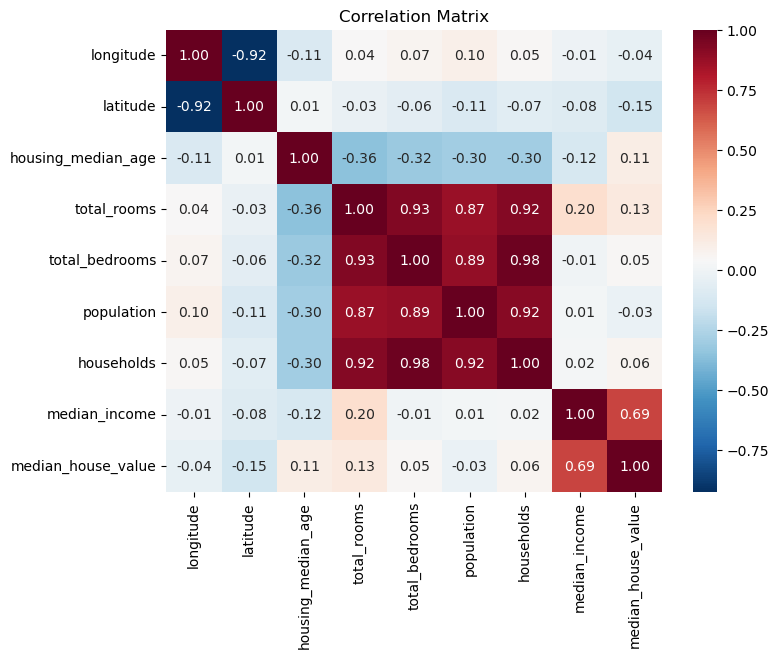

In [17]:
# Correlaiton matrix for numerical columns
corr = train_set.select_dtypes(include=['number']).corr()
plt.figure(figsize=(8, 6))
# Hints to remember for me.
#fmt=".2f": Formats the annotation text to two decimal places.
#annot=True is set in the Seaborn heatmap function, it adds numerical annotations to each cell in the heatmap.
#types of  cmap:'plasma','inferno',magma',cividis',coolwarm','RdBu_r','YlGnBu'.
#cbar=False: Removes the color bar from the heatmap., if true will apper the bar 
#annot_kws: Adjusts the font size of the annotation text to 10.
sns.heatmap(corr, annot=True, fmt=".2f", cmap='RdBu_r', cbar=True, annot_kws={'size':10})
plt.title("Correlation Matrix")
plt.show()

**from heat map we see the corr with my target is median-income**

In [18]:
train_set.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
17595,-120.07,36.98,12.0,1790.0,379.0,1399.0,397.0,2.5388,59600.0,INLAND
6073,-118.22,33.86,16.0,8732.0,1489.0,3944.0,1493.0,5.1948,203500.0,<1H OCEAN
6251,-120.94,39.32,14.0,3120.0,595.0,1569.0,556.0,3.5385,157400.0,INLAND
3161,-122.11,37.68,37.0,1976.0,481.0,1197.0,465.0,2.5772,170200.0,NEAR BAY
1887,-121.34,38.67,35.0,643.0,117.0,331.0,134.0,3.0417,120700.0,INLAND


In [19]:
numeric_columns = train_set.select_dtypes(include=['float64', 'int64']) # or  include 'number '
corr_matrix = numeric_columns.corr()

In [20]:
corr_matrix["median_house_value"].sort_values(ascending=False)

median_house_value    1.000000
median_income         0.689988
total_rooms           0.131754
housing_median_age    0.108490
households            0.062802
total_bedrooms        0.045670
population           -0.025377
longitude            -0.041624
latitude             -0.149469
Name: median_house_value, dtype: float64

**we see that the high correlation betweeen median-income and median-house-value and the heatmap ensure that before**

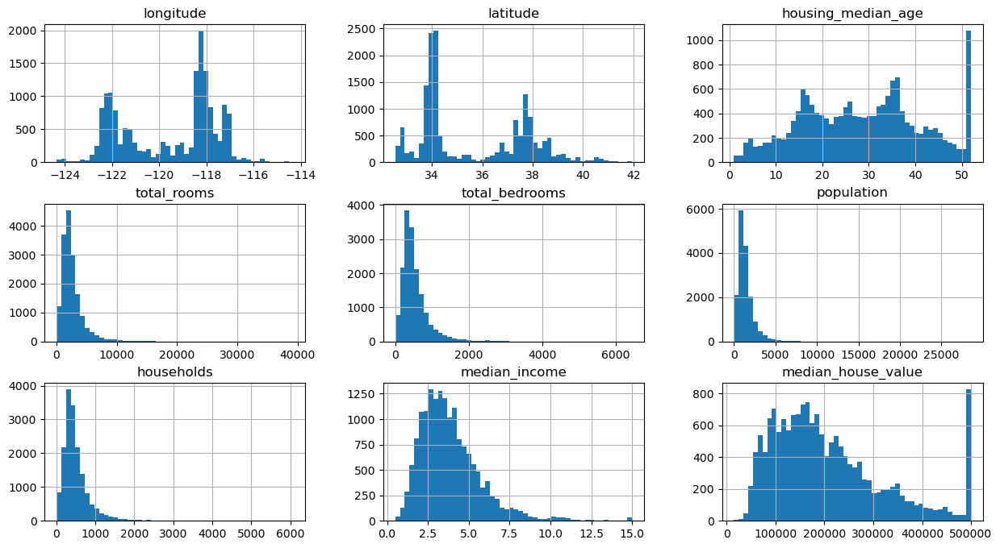

In [21]:
train_set.hist(bins=50, figsize=(15, 8))
plt.show()

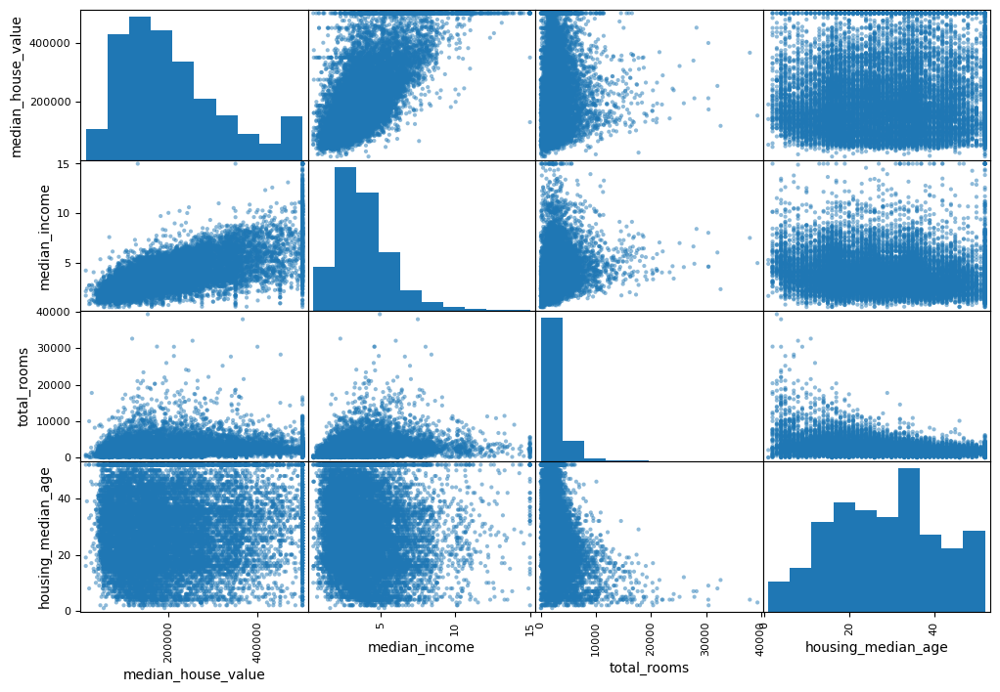

In [22]:
attributes = ["median_house_value", "median_income", "total_rooms","housing_median_age"]
scatter_matrix(train_set[attributes], figsize=(12, 8))
plt.show()

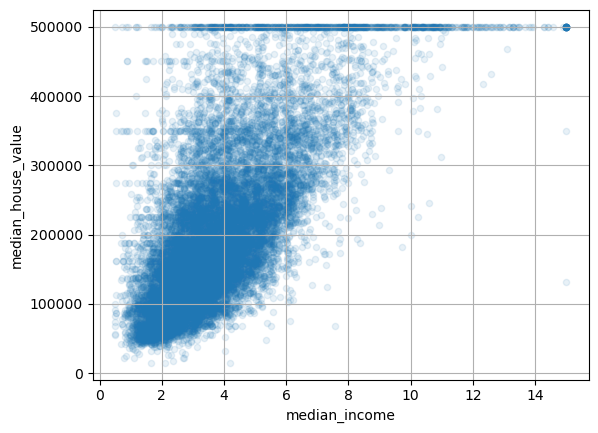

In [23]:
train_set.plot(kind="scatter", x="median_income", y="median_house_value",
alpha=0.1, grid=True)
plt.show();

**there is a high corr between income and median-house-bricing**

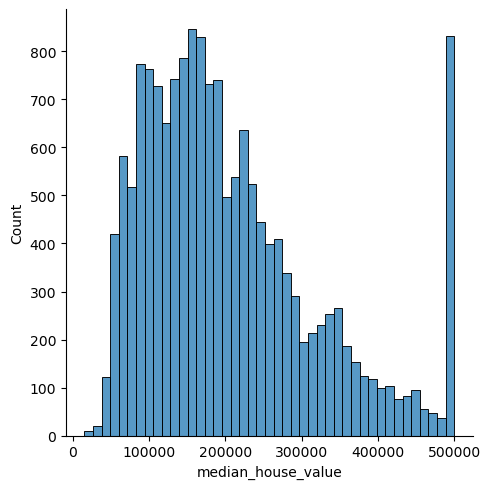

In [24]:
sns.displot(x = train_set['median_house_value'], data=housing);

**we see that most frequensies in median-house-pricing between 10000 to 20000**

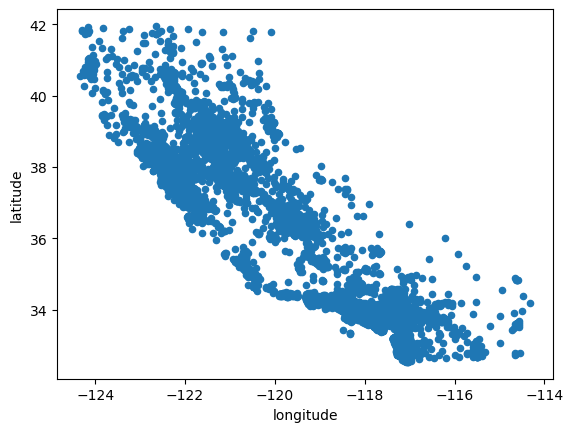

In [25]:
#py plot in pandas 
train_set.plot(kind="scatter", x="longitude", y="latitude");

**we see that there is a high correletion between longitude and latitude**

<Axes: xlabel='ocean_proximity', ylabel='Count'>

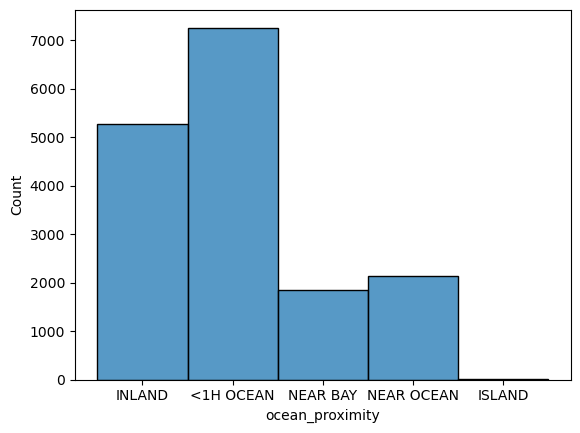

In [26]:
sns.histplot(x=train_set['ocean_proximity'],data=housing)

<Axes: >

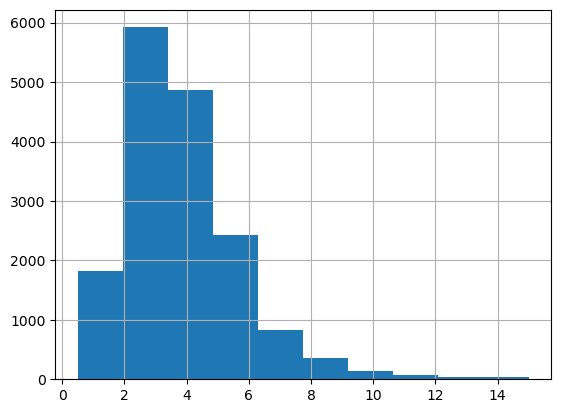

In [27]:
train_set["median_income"].hist()

In [28]:
# to make it more useful with population and median_house_value
fig = px.scatter(train_set, x='longitude', y='latitude', size='population', 
                 color='median_house_value', color_continuous_scale='jet',
                 labels={'median_house_value': 'Median House Value'},
                 title='Housing Price Scatterplot',
                 opacity=0.6, size_max=40)

fig.update_layout(coloraxis_colorbar=dict(title='Median House Value'))
fig.show()

**we can make a feature extraction from longitude and latitude to repalce them by one feature or make feature selection and select one feature and drop the other , if we want that**

In [29]:
columns = list(train_set.columns)[:9]

fig = sp.make_subplots(rows=3, cols=3, subplot_titles=[f'{column}' for column in columns])

for i, column in enumerate(columns):
    row, col = divmod(i, 3)  # Calculate the row and column index
    histogram = go.Histogram(x=train_set[column], name=column)
    fig.add_trace(histogram, row=row + 1, col=col + 1)

fig.update_layout(height=500, width=950, title_text="Data Distribution")
fig.update_xaxes(tickangle=45)  # Rotate x-axis labels

fig.show()

----------------

# `04` Data Preparation

Perform data cleaning, feature engineering, scaling, etc. as needed to make sure it's ready for the model.

Hint: It could be helpful to check `sklearn.preprocessing` module.

### Handling missing values

In [30]:
housing = train_set.drop("median_house_value", axis=1)
housing_labels = train_set["median_house_value"].copy()

In [31]:
housing

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity
17595,-120.07,36.98,12.0,1790.0,379.0,1399.0,397.0,2.5388,INLAND
6073,-118.22,33.86,16.0,8732.0,1489.0,3944.0,1493.0,5.1948,<1H OCEAN
6251,-120.94,39.32,14.0,3120.0,595.0,1569.0,556.0,3.5385,INLAND
3161,-122.11,37.68,37.0,1976.0,481.0,1197.0,465.0,2.5772,NEAR BAY
1887,-121.34,38.67,35.0,643.0,117.0,331.0,134.0,3.0417,INLAND
...,...,...,...,...,...,...,...,...,...
8222,-120.04,36.79,48.0,1341.0,239.0,671.0,208.0,2.7917,INLAND
9449,-118.18,36.63,23.0,2311.0,487.0,1019.0,384.0,2.2574,INLAND
8471,-119.71,34.43,47.0,1572.0,417.0,790.0,384.0,2.6429,<1H OCEAN
17048,-117.92,33.62,35.0,1821.0,335.0,727.0,316.0,6.5842,<1H OCEAN


In [32]:
train_set.isna().sum()

longitude               0
latitude                0
housing_median_age      0
total_rooms             0
total_bedrooms        158
population              0
households              0
median_income           0
median_house_value      0
ocean_proximity         0
dtype: int64

In [33]:
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(strategy="median") # we will use median beacuse we have outliers 

In [34]:
housing_numeric = housing.select_dtypes(include=[np.number])
imputer.fit(housing_numeric)

SimpleImputer(strategy='median')

In [35]:
imputer.statistics_

array([-118.5   ,   34.26  ,   29.    , 2128.    ,  435.    , 1166.    ,
        410.    ,    3.5394])

In [36]:
housing_numeric.median().values

array([-118.5   ,   34.26  ,   29.    , 2128.    ,  435.    , 1166.    ,
        410.    ,    3.5394])

**we see it is matching from model and our data**

## Transform the training data

In [37]:
New_Housing_Data= imputer.transform(housing_numeric)
New_Housing_Data

array([[-1.2007e+02,  3.6980e+01,  1.2000e+01, ...,  1.3990e+03,
         3.9700e+02,  2.5388e+00],
       [-1.1822e+02,  3.3860e+01,  1.6000e+01, ...,  3.9440e+03,
         1.4930e+03,  5.1948e+00],
       [-1.2094e+02,  3.9320e+01,  1.4000e+01, ...,  1.5690e+03,
         5.5600e+02,  3.5385e+00],
       ...,
       [-1.1971e+02,  3.4430e+01,  4.7000e+01, ...,  7.9000e+02,
         3.8400e+02,  2.6429e+00],
       [-1.1792e+02,  3.3620e+01,  3.5000e+01, ...,  7.2700e+02,
         3.1600e+02,  6.5842e+00],
       [-1.1819e+02,  3.4650e+01,  3.3000e+01, ...,  9.1300e+02,
         3.1400e+02,  3.9963e+00]])

In [38]:
New_Housing_Data_Transformed = pd.DataFrame(New_Housing_Data, columns=housing_numeric.columns,index=housing_numeric.index)

In [39]:
New_Housing_Data_Transformed

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income
17595,-120.07,36.98,12.0,1790.0,379.0,1399.0,397.0,2.5388
6073,-118.22,33.86,16.0,8732.0,1489.0,3944.0,1493.0,5.1948
6251,-120.94,39.32,14.0,3120.0,595.0,1569.0,556.0,3.5385
3161,-122.11,37.68,37.0,1976.0,481.0,1197.0,465.0,2.5772
1887,-121.34,38.67,35.0,643.0,117.0,331.0,134.0,3.0417
...,...,...,...,...,...,...,...,...
8222,-120.04,36.79,48.0,1341.0,239.0,671.0,208.0,2.7917
9449,-118.18,36.63,23.0,2311.0,487.0,1019.0,384.0,2.2574
8471,-119.71,34.43,47.0,1572.0,417.0,790.0,384.0,2.6429
17048,-117.92,33.62,35.0,1821.0,335.0,727.0,316.0,6.5842


In [40]:
New_Housing_Data_Transformed.isnull().sum()

longitude             0
latitude              0
housing_median_age    0
total_rooms           0
total_bedrooms        0
population            0
households            0
median_income         0
dtype: int64

**we fill now missing values**

###  Handling categorical data

In [41]:
# will deal with categorical data and convert into numerical 
housing_cat = housing[["ocean_proximity"]]
housing_cat.head(10)

,ocean_proximity
17595,INLAND
6073,<1H OCEAN
6251,INLAND
3161,NEAR BAY
1887,INLAND
151,<1H OCEAN
8888,NEAR OCEAN
6273,NEAR BAY
7383,INLAND
19964,<1H OCEAN


In [42]:
housing["ocean_proximity"].value_counts() 

ocean_proximity
<1H OCEAN     7256
INLAND        5267
NEAR OCEAN    2139
NEAR BAY      1846
ISLAND           4
Name: count, dtype: int64

In [43]:
from sklearn.preprocessing import OrdinalEncoder

ordinal_encoder = OrdinalEncoder()
housing_cat_encoded = ordinal_encoder.fit_transform(housing_cat)
housing_cat_encoded[:10]


array([[1.],
       [0.],
       [1.],
       [3.],
       [1.],
       [0.],
       [4.],
       [3.],
       [1.],
       [0.]])

In [44]:
ordinal_encoder.categories_

[array(['<1H OCEAN', 'INLAND', 'ISLAND', 'NEAR BAY', 'NEAR OCEAN'],
       dtype=object)]

**we already handle categorical data and use OnHotEncoder because we did not to give any priority to any label**

In [45]:
# Pipeline that imputes and then scales the input features
num_pipeline = Pipeline([
    ("impute", SimpleImputer(strategy="median")),
    ("standardize", StandardScaler()),
])
housing_num_tr = num_pipeline.fit_transform(housing_numeric)

In [46]:
num_pipeline

Pipeline(steps=[('impute', SimpleImputer(strategy='median')),
                ('standardize', StandardScaler())])

In [47]:
housing_num_tr

array([[-0.24583875,  0.62544628, -1.31746816, ..., -0.02073928,
        -0.26626147, -0.70176471],
       [ 0.6753656 , -0.8318435 , -1.00056531, ...,  2.25172265,
         2.5943348 ,  0.6988298 ],
       [-0.67905377,  1.7184136 , -1.15901673, ...,  0.13105582,
         0.14873379, -0.17459064],
       ...,
       [-0.06657736, -0.56560787,  1.45543184, ..., -0.56452291,
        -0.3001919 , -0.64686942],
       [ 0.82475009, -0.94394271,  0.50472327, ..., -0.62077638,
        -0.47767415,  1.43150525],
       [ 0.69030405, -0.46285025,  0.34627184, ..., -0.45469469,
        -0.48289422,  0.06682207]])

In [50]:
num_attribs = list(housing_numeric)
cat_attribs = ['ocean_proximity']

full_pipeline = ColumnTransformer([
        ("num", num_pipeline, num_attribs),
        ("cat", OrdinalEncoder(), cat_attribs),
    ])

housing_prepared = full_pipeline.fit_transform(train_set)

In [51]:
housing_prepared

array([[-0.24583875,  0.62544628, -1.31746816, ..., -0.26626147,
        -0.70176471,  1.        ],
       [ 0.6753656 , -0.8318435 , -1.00056531, ...,  2.5943348 ,
         0.6988298 ,  0.        ],
       [-0.67905377,  1.7184136 , -1.15901673, ...,  0.14873379,
        -0.17459064,  1.        ],
       ...,
       [-0.06657736, -0.56560787,  1.45543184, ..., -0.3001919 ,
        -0.64686942,  0.        ],
       [ 0.82475009, -0.94394271,  0.50472327, ..., -0.47767415,
         1.43150525,  0.        ],
       [ 0.69030405, -0.46285025,  0.34627184, ..., -0.48289422,
         0.06682207,  1.        ]])

In [52]:
housing_prepared.shape

(16512, 9)

In [53]:
 ordinal_encoder.categories_

[array(['<1H OCEAN', 'INLAND', 'ISLAND', 'NEAR BAY', 'NEAR OCEAN'],
       dtype=object)]

## `#` Prepare Test Set

Apply the data transformations you used on the training set to the test set.

**Important Note:** DO NOT use `fit` on the test set.

In [54]:
test = test_set.drop("median_house_value", axis=1)
test_labels = test_set["median_house_value"].copy()

In [55]:
test_num = test.select_dtypes(include=[np.number])
test_imputed = imputer.transform(test_num)

In [56]:
test['ocean_proximity'] = ordinal_encoder.transform(test['ocean_proximity'].values.reshape(-1, 1))
test['ocean_proximity'].value_counts()

ocean_proximity
0.0    1880
1.0    1284
4.0     519
3.0     444
2.0       1
Name: count, dtype: int64

In [57]:
test_prepared = full_pipeline.transform(test_set)

----------------------------

# `05` Normal Equation

Using `sklearn` implementation of the linear regression closed-form solution, i.e. normal equation, to model the data.

Hint: Look for `sklearn.linear_model.LinearRegression` class.

## `i` Model Training

Initializing the model, fitting it to the training data, and get a fitted model.

In [58]:
%%time
# x_test=housing_prepared , y_test=housing_labels
lin_reg = LinearRegression()
lin_reg.fit(housing_prepared,housing_labels)

CPU times: total: 78.1 ms
Wall time: 33.9 ms


LinearRegression()

In [59]:
# Model Evaluation
y_pred = lin_reg.predict(housing_prepared)
y_pred.round()

array([ 83781., 278295.,  78991., ..., 250781., 341808., 195582.])

In [60]:
housing_labels.values

array([ 59600., 203500., 157400., ..., 279200., 458500., 126800.])

In [61]:
print ('Coefficients: ', lin_reg.coef_)
print ('Intercept: ', lin_reg.intercept_)

Coefficients:  [-84422.36241824 -90442.12645462  14751.55008372 -13383.32602483
  32060.1715589  -48796.96673787  34483.1370235   75650.33322765
    237.44018127]
Intercept:  206907.1518973415


## `ii` Model Evaluation

Evaluate model performance using several metrics, e.g. **RMSE**, **MAE**, $R^2$. etc.

In [62]:
# This prediction is way off and we chose RMSE as our performance measure
from sklearn.metrics import mean_squared_error
lin_rmse = mean_squared_error(housing_labels, y_pred, squared=False)
print(f'Root Mean Squared Error : {lin_rmse}')

Root Mean Squared Error : 69406.34099646157


In [63]:
r2=r2_score(housing_labels, y_pred)
print(f'R-square of the model : {r2}')

R-square of the model : 0.6396467701521297


In [64]:
mae=mean_absolute_error(housing_labels, y_pred)
print(f'MAE of the model: {mae}')

MAE of the model: 50922.21088916469


----------------------

# `06` Linear Regression with Gradient Descent

Using `sklearn` implementation of linear regression to model the data.

Hint: Look for `sklearn.linear_model.SGDRegressor` class.

## `i` Baseline Model Training

Initializing the model with initial parameters, fitting it to the training data, and get a baseline model.

Use:
- Non-regularized model.
- Constant `learning_rate`

In [65]:
from sklearn.linear_model import SGDRegressor
reg=SGDRegressor(max_iter=1000, tol=1e-3, random_state=1234)

In [66]:
reg.fit(housing_prepared,housing_labels)

SGDRegressor(random_state=1234)

In [67]:
housing_predictions = reg.predict(housing_prepared)
housing_predictions.round() 

array([ 88510., 271909.,  84771., ..., 248325., 338869., 194874.])

In [68]:
housing_labels.values

array([ 59600., 203500., 157400., ..., 279200., 458500., 126800.])

## `ii` Model Evaluation

Evaluate the baseline model performance using several metrics, e.g. **RMSE**, **MAE**, $R^2$. etc.

In [70]:
from sklearn.metrics import mean_squared_error
lin_rmse = mean_squared_error(housing_labels, y_pred, squared=False)
print(f'Root Mean Squared Error : {lin_rmse}')

Root Mean Squared Error : 69406.34099646157


In [71]:
r2=r2_score(housing_labels, y_pred)
print(f'R-square of the model : {r2}')

R-square of the model : 0.6396467701521297


In [72]:
mae=mean_absolute_error(housing_labels, y_pred)
print(f'MAE of the model: {mae}')

MAE of the model: 50922.21088916469


## `iii` Tune `learning_rate`

Try different `learning_rate` values and evaluate. What is the optimal learning rate?

Hint: You might want to use `sklearn.model_selection.RandomizedSearchCV` or `sklearn.model_selection.GridSearchCV` classes.

In [74]:
pram_grid={
    'penalty':[None],
    'learning_rate':['constant','optimal','invscaling','adaptive']
}

lin_reg=SGDRegressor(random_state=1234)

grid_search=GridSearchCV(lin_reg,pram_grid,cv=5,scoring='neg_mean_squared_error',return_train_score=True)
grid_search.fit(housing_prepared,housing_labels)

GridSearchCV(cv=5, estimator=SGDRegressor(random_state=1234),
             param_grid={'learning_rate': ['constant', 'optimal', 'invscaling',
                                           'adaptive'],
                         'penalty': [None]},
             return_train_score=True, scoring='neg_mean_squared_error')

In [75]:
grid_search.best_params_

{'learning_rate': 'adaptive', 'penalty': None}

In [76]:
grid_search.best_estimator_

SGDRegressor(learning_rate='adaptive', penalty=None, random_state=1234)

In [77]:
grid_search.cv_results_

{'mean_fit_time': array([0.0115756 , 0.03310742, 0.02493334, 0.05963969]),
 'std_fit_time': array([0.00440787, 0.00733333, 0.00667544, 0.00750818]),
 'mean_score_time': array([0.00099616, 0.00060287, 0.00039897, 0.00059838]),
 'std_score_time': array([0.00063091, 0.00049229, 0.00048864, 0.00048858]),
 'param_learning_rate': masked_array(data=['constant', 'optimal', 'invscaling', 'adaptive'],
              mask=[False, False, False, False],
        fill_value='?',
             dtype=object),
 'param_penalty': masked_array(data=[None, None, None, None],
              mask=[False, False, False, False],
        fill_value='?',
             dtype=object),
 'params': [{'learning_rate': 'constant', 'penalty': None},
  {'learning_rate': 'optimal', 'penalty': None},
  {'learning_rate': 'invscaling', 'penalty': None},
  {'learning_rate': 'adaptive', 'penalty': None}],
 'split0_test_score': array([-5.58473705e+09, -5.45036570e+09, -5.12037586e+09, -5.09412658e+09]),
 'split1_test_score': array([-

**we will use randomsearch**

In [78]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.linear_model import SGDRegressor

param_dist = {
    'penalty': [None],
    'learning_rate': ['constant', 'optimal', 'invscaling', 'adaptive'],
    'alpha': [0.0001, 0.001, 0.01, 0.1],
    'eta0': [0.01, 0.1, 0.5, 1.0],
    'max_iter': [1000, 2000, 3000]
}

lin_reg = SGDRegressor(random_state=1234)
random_search = RandomizedSearchCV(lin_reg, param_distributions=param_dist, n_iter=10, cv=5, scoring='neg_mean_squared_error', random_state=42, return_train_score=True)

random_search.fit(housing_prepared, housing_labels)

RandomizedSearchCV(cv=5, estimator=SGDRegressor(random_state=1234),
                   param_distributions={'alpha': [0.0001, 0.001, 0.01, 0.1],
                                        'eta0': [0.01, 0.1, 0.5, 1.0],
                                        'learning_rate': ['constant', 'optimal',
                                                          'invscaling',
                                                          'adaptive'],
                                        'max_iter': [1000, 2000, 3000],
                                        'penalty': [None]},
                   random_state=42, return_train_score=True,
                   scoring='neg_mean_squared_error')

In [79]:
best_params = random_search.best_params_
best_params

{'penalty': None,
 'max_iter': 1000,
 'learning_rate': 'adaptive',
 'eta0': 0.01,
 'alpha': 0.0001}

In [80]:
best_model = random_search.best_estimator_
best_model

SGDRegressor(learning_rate='adaptive', penalty=None, random_state=1234)

## `iv` Regularization Mode: On

Let's try $l_1$ and $l_2$ regularization. Use default parameters for simplicity. Does regularization made the model generalize better?

Which of the two regularizations performs better?

## l1

In [82]:
clf = Ridge(alpha=1.0)
clf.fit(housing_prepared, housing_labels)

Ridge()

In [83]:
lin_rmse = mean_squared_error(housing_labels, housing_predictions,
                              squared=False)
lin_rmse


69536.20223738138

## l2

In [84]:
lasso = linear_model.Lasso(alpha=0.1)
lasso.fit(housing_prepared, housing_labels)

Lasso(alpha=0.1)

In [85]:
lin_rmse = mean_squared_error(housing_labels, housing_predictions,
                              squared=False)
lin_rmse

69536.20223738138

------------------

# `07` Generalization Error

Now that we have tuned our solution, to an *extent*, we need to test for a final time on the held out test set.

In [89]:
final_model = grid_search.best_estimator_

X_test = test_set.drop("median_house_value", axis=1)
y_test = test_set["median_house_value"].copy()

X_test_prepared = full_pipeline.transform(X_test)
final_predictions = final_model.predict(X_test_prepared)

final_mse = mean_squared_error(y_test, final_predictions)
final_rmse = np.sqrt(final_mse)

In [90]:
final_mse

5012776342.946702

-----------------------------

# `Bonus` Better Flow

For the model to be production-ready, we need to integrate it into a pipeline along with the data preparation flow.

Hint: Look up `sklearn.pipeline.Pipeline` class.

In [91]:
full_pipeline_with_predictor = Pipeline([
        ("preparation", full_pipeline),
        ("linear", LinearRegression())
    ])

full_pipeline_with_predictor.fit(housing, housing_labels)
full_pipeline_with_predictor.predict(test_set)

array([263670.41202549, 257563.00438274,  65435.32508766, ...,
       221156.85603343, 340117.76634488, 272341.54802923])

In [92]:
mse = mean_squared_error(y_test, final_predictions)
rmse = np.sqrt(mse)

In [93]:
mse

5012776342.946702

In [94]:
my_model = full_pipeline_with_predictor

In [95]:
import joblib
joblib.dump(my_model, "my_model.pkl") 

my_model_loaded = joblib.load("my_model.pkl")

----------------------------------------------

$$ Wish \space you \space all \space the \space best \space ♡ $$
$$ Abdelrahman \space Eid $$